#Module: Data Exploration & Preparation
<br>Lecturer: Dr. Muhammad Iqbal
<br>Students:
<br>**Rita Anabel Gomez **
<br>**Cesar Alejandro Avila Calderon **
<br>**Zaray Salas Lopez **

In [ ]:
from google.colab  import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn import preprocessing
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

### Dataset: "Bike Sales"

In [ ]:
path = '/content/drive/Shareddrives/CA-DataExploration&Preparation/Bikes_Sales.csv'
dataset_original = pd.read_csv(path)
dataset_original

,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113031,2016-04-12,12,April,2016,41,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S",3,24,64,112,72,184
113032,2014-04-02,2,April,2014,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113033,2016-04-02,2,April,2016,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113034,2014-03-04,4,March,2014,37,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",24,24,64,684,576,1260


a) Identify which variables are categorical, discrete and continuous in the chosen data set and show using some visualization or plot. Explore whether there are missing values for any of the variables.

### The following step is to gather some information about different columns in our DataFrame. We can do so by using .info(), which basically gives us information about the number of rows, columns, column data types, memory usage, etc. The columns with object dtype are the categorical variables in our dataset.
### One of the most common ways to analyze the relationship between a categorical feature and a continuous feature is to plot a boxplot, so that is what we tried to demostrate later on. 

In [ ]:
print(dataset_original.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113036 entries, 0 to 113035
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Date              113036 non-null  object
 1   Day               113036 non-null  int64 
 2   Month             113036 non-null  object
 3   Year              113036 non-null  int64 
 4   Customer_Age      113036 non-null  int64 
 5   Age_Group         113036 non-null  object
 6   Customer_Gender   113036 non-null  object
 7   Country           113036 non-null  object
 8   State             113036 non-null  object
 9   Product_Category  113036 non-null  object
 10  Sub_Category      113036 non-null  object
 11  Product           113036 non-null  object
 12  Order_Quantity    113036 non-null  int64 
 13  Unit_Cost         113036 non-null  int64 
 14  Unit_Price        113036 non-null  int64 
 15  Profit            113036 non-null  int64 
 16  Cost              113036 non-null  int

###To filter the different types of variables, in this case we filtered categorical variables out. We created a separate DataFrame consisting of these different types of variables by running the following command. 
###In additional, the method .copy() is used here so that any changes made in new DataFrame don't get reflected in the original one.
##Here is shown a subdataset with categorical variables.

In [ ]:
categor_dataset = dataset_original.select_dtypes(include=['object']).copy()
categor_dataset.head()
#here are the categorical variables displayed 

,Date,Month,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product
0,2013-11-26,November,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike
1,2015-11-26,November,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike
2,2014-03-23,March,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike
3,2016-03-23,March,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike
4,2014-05-15,May,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike


### The following bar plot shows the comparision between categorical variables we have within Category of products, this indicates the different profits that have been made according to the the different countries.

Text(3.799999999999997, 0.5, 'Profit')

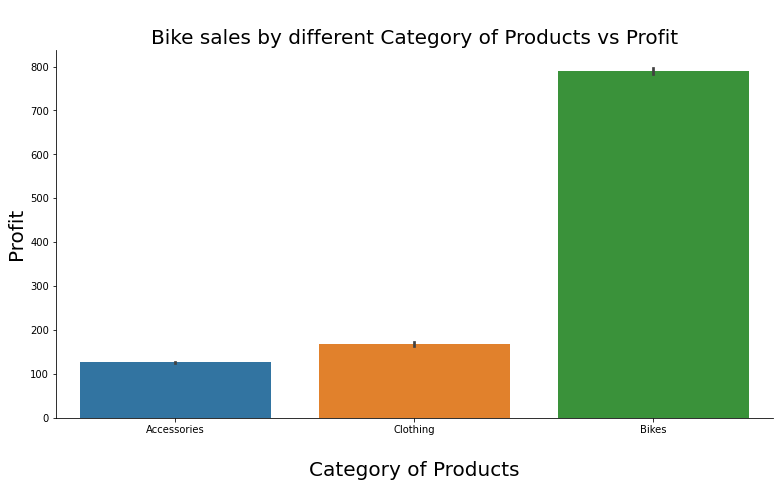

In [ ]:
#bar plot between 2 Categorical variables
sns.catplot(x='Product_Category', y='Profit', kind="bar", data=dataset_original) #estimator=np.mean/median/std/var)
plt.gcf().set_size_inches(12, 6)
plt.title('\nBike sales by different Category of Products vs Profit', fontsize= 20)
plt.xlabel("\nCategory of Products",fontsize=20)
#plt.xticks(rotation=45)
plt.ylabel("Profit", fontsize=20)

###Here is showm a subdataset with continuous variables.

In [ ]:
continuous_dataset = dataset_original.select_dtypes(include=['int64']).copy()
continuous_dataset.head()
#here are the continuous variables displayed

,Day,Year,Customer_Age,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,26,2013,19,8,45,120,590,360,950
1,26,2015,19,8,45,120,590,360,950
2,23,2014,49,23,45,120,1366,1035,2401
3,23,2016,49,20,45,120,1188,900,2088
4,15,2014,47,4,45,120,238,180,418


###Box plot 

###A box plot (or box-and-whisker plot) shows the distribution of quantitative data in a way that facilitates comparisons between variables or across levels of a categorical variable.
### The following graph shows the presence of points outside of the boxes indicating the existance of “outliers” in the Customer_age column which can be eliminated. In this case customer is a variable independent so that is why we treat it separated of the rest of numeric variables.

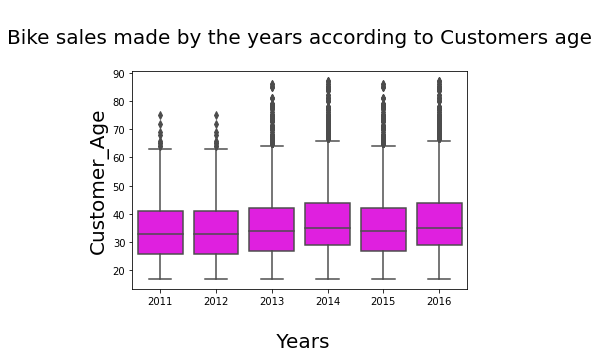

In [ ]:
sns.boxplot(x='Year',y='Customer_Age',data=dataset_original, color='magenta')
plt.title('\nBike sales made by the years according to Customers age\n', fontsize=20)
plt.xlabel("\n Years",fontsize=20)
plt.ylabel("Customer_Age",fontsize=20)
plt.rcParams["figure.figsize"] = [17.55, 6.60]
plt.rcParams["figure.autolayout"] = True

plt.show()

###We could also identified Outliers in the Revenue column which is a dependent variable, and they also can be eliminated.

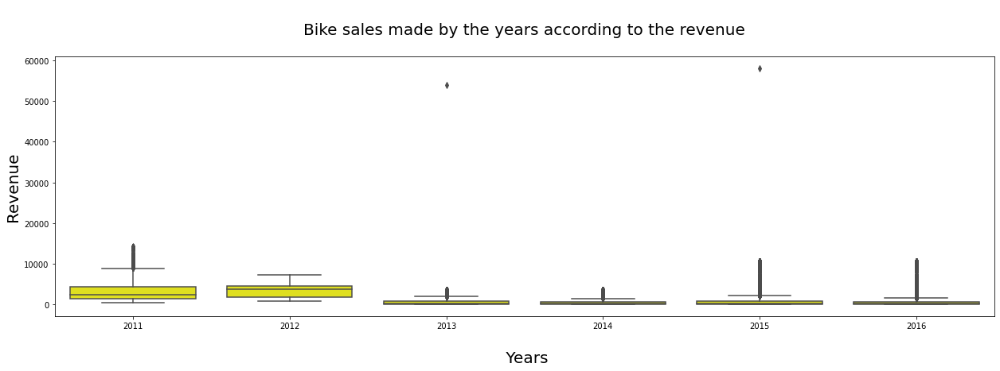

In [ ]:
sns.boxplot(x='Year',y='Revenue',data=dataset_original, color='yellow')
plt.title('\nBike sales made by the years according to the revenue\n', fontsize=20)
plt.xlabel("\n Years",fontsize=20)
plt.ylabel("Revenue",fontsize=20)
plt.rcParams["figure.figsize"] = [17.55, 6.60]
plt.rcParams["figure.autolayout"] = True

plt.show()

Dropping Outliners

In [ ]:
Q1 = np.percentile(dataset_original['Customer_Age'], 25, interpolation = 'midpoint')
 
Q3 = np.percentile(dataset_original['Customer_Age'], 75, interpolation = 'midpoint')
IQR = Q3 - Q1
 
print("Old Shape: ", dataset_original.shape)

upper = np.where(dataset_original['Customer_Age'] >= (Q3+1.5*IQR))
lower = np.where(dataset_original['Customer_Age'] <= (Q1-1.5*IQR))

dataset_original.drop(upper[0], inplace = True)
dataset_original.drop(lower[0], inplace = True)

dataset_wo_outliners = dataset_original
print("New Shape: ", dataset_wo_outliners.shape)
dataset_wo_outliners

Old Shape:  (113036, 18)
New Shape:  (112502, 18)


,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113031,2016-04-12,12,April,2016,41,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S",3,24,64,112,72,184
113032,2014-04-02,2,April,2014,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113033,2016-04-02,2,April,2016,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113034,2014-03-04,4,March,2014,37,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",24,24,64,684,576,1260


### Dropping the duplicate rows
### This is often a handy thing to do because a huge data set as in this case contains more than 10, 000 rows often have some duplicate data which might be disturbing, so here I remove all the duplicate value from the data-set.

In [ ]:
# Rows containing duplicate data
duplicate_rows_dataset = dataset_wo_outliners[dataset_wo_outliners.duplicated()]
print("number of duplicate rows: ", duplicate_rows_dataset.shape)
#Now let us remove the duplicate data because it's ok to remove them.
# Used to count the number of rows before removing the data
print(dataset_wo_outliners.shape)
print('So seen above there are 112502 rows and we are removing 992 rows of duplicate data.')
dataset_wo_duplicates = dataset_wo_outliners.drop_duplicates()

numerical_dataset_wo_duplicates =  dataset_wo_duplicates.iloc[:,[1,3,4, 12,13,14,15,16,17]]
categorical_dataset_wo_duplicates =  dataset_wo_duplicates.iloc[:,[0,2,5,6,7,8,9,10,11]]

dataset_wo_duplicates

number of duplicate rows:  (992, 18)
(112502, 18)
So seen above there are 112502 rows and we are removing 992 rows of duplicate data.


,Date,Day,Month,Year,Customer_Age,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,26,November,2013,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
1,2015-11-26,26,November,2015,19,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,8,45,120,590,360,950
2,2014-03-23,23,March,2014,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,23,45,120,1366,1035,2401
3,2016-03-23,23,March,2016,49,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,20,45,120,1188,900,2088
4,2014-05-15,15,May,2014,47,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,4,45,120,238,180,418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113031,2016-04-12,12,April,2016,41,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S",3,24,64,112,72,184
113032,2014-04-02,2,April,2014,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113033,2016-04-02,2,April,2016,18,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",22,24,64,655,528,1183
113034,2014-03-04,4,March,2014,37,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",24,24,64,684,576,1260


In [ ]:
# Counting the number of rows after removing duplicates.
print(dataset_wo_duplicates.shape)

(111510, 18)


###Dropping the missing or null values.

In [ ]:
# Finding the null values.
print(dataset_wo_duplicates.isnull().sum())

Date                0
Day                 0
Month               0
Year                0
Customer_Age        0
Age_Group           0
Customer_Gender     0
Country             0
State               0
Product_Category    0
Sub_Category        0
Product             0
Order_Quantity      0
Unit_Cost           0
Unit_Price          0
Profit              0
Cost                0
Revenue             0
dtype: int64


c) Apply Min-Max Normalization, Z-score Standardization and Robust scalar on the numerical data variables.

Min Max Normalization

In [ ]:
x = numerical_dataset_wo_duplicates.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
min_max_scaler_dataset = pd.DataFrame(x_scaled)
x = min_max_scaler_dataset.values #returns a numpy array
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
min_max_scaler_dataset = pd.DataFrame(x_scaled)
min_max_scaler_dataset.rename(columns={0:'Day(MM)'},inplace=True)
min_max_scaler_dataset.rename(columns={1:'Year(MM)'},inplace=True)
min_max_scaler_dataset.rename(columns={2:'Customer_Age(MM)'},inplace=True)
min_max_scaler_dataset.rename(columns={3:'Order_Quantity(MM)'},inplace=True)
min_max_scaler_dataset.rename(columns={4:'Unit_Cost(MM)'},inplace=True)
min_max_scaler_dataset.rename(columns={5:'Unit_Price(MM)'},inplace=True)
min_max_scaler_dataset.rename(columns={6:'Profit(MM)'},inplace=True)
min_max_scaler_dataset.rename(columns={7:'Cost(MM)'},inplace=True)
min_max_scaler_dataset.rename(columns={8:'Revenue(MM)'},inplace=True)
min_max_scaler_dataset

,Day(MM),Year(MM),Customer_Age(MM),Order_Quantity(MM),Unit_Cost(MM),Unit_Price(MM),Profit(MM),Cost(MM),Revenue(MM)
0,0.833333,0.4,0.041667,0.225806,0.020276,0.032998,0.040989,0.008353,0.016325
1,0.833333,0.8,0.041667,0.225806,0.020276,0.032998,0.040989,0.008353,0.016325
2,0.733333,0.6,0.666667,0.709677,0.020276,0.032998,0.092291,0.024059,0.041311
3,0.733333,1.0,0.666667,0.612903,0.020276,0.032998,0.080524,0.020918,0.035921
4,0.466667,0.6,0.625000,0.096774,0.020276,0.032998,0.017718,0.004165,0.007164
...,...,...,...,...,...,...,...,...,...
111505,0.366667,1.0,0.500000,0.064516,0.010599,0.017338,0.009388,0.001652,0.003134
111506,0.033333,0.6,0.020833,0.677419,0.010599,0.017338,0.045286,0.012262,0.020337
111507,0.033333,1.0,0.020833,0.677419,0.010599,0.017338,0.045286,0.012262,0.020337
111508,0.100000,0.6,0.416667,0.741935,0.010599,0.017338,0.047203,0.013379,0.021663


Robust Scaler

In [ ]:
# Use scaler of choice; here Standard scaler is used
robust_scaler_values = StandardScaler().fit(numerical_dataset_wo_duplicates.values).transform(numerical_dataset_wo_duplicates.values)
col_names_scale = ['Day(RS)', 'Year(RS)', 'Customer_Age(RS)', 'Order_Quantity(RS)','Unit_Cost(RS)','Unit_Price(RS)','Profit(RS)','Cost(RS)','Revenue(RS)']
robust_scaler_dataset =  dataset_wo_duplicates.iloc[:,[]]
robust_scaler_dataset[col_names_scale] = robust_scaler_values
robust_scaler_dataset

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:659: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:3076: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-vers

,Day(RS),Year(RS),Customer_Age(RS),Order_Quantity(RS),Unit_Cost(RS),Unit_Price(RS),Profit(RS),Cost(RS),Revenue(RS)
0,1.175980,-1.099351,-1.557904,-0.407305,-0.406011,-0.362896,0.666864,-0.126384,0.145666
1,1.175980,0.470879,-1.557904,-0.407305,-0.406011,-0.362896,0.666864,-0.126384,0.145666
2,0.834413,-0.314236,1.232555,1.160839,-0.406011,-0.362896,2.371819,0.633829,1.250529
3,0.834413,1.255993,1.232555,0.847210,-0.406011,-0.362896,1.980734,0.481786,1.012195
4,-0.076434,-0.314236,1.046524,-0.825477,-0.406011,-0.362896,-0.106518,-0.329108,-0.259425
...,...,...,...,...,...,...,...,...,...
113031,-0.418001,1.255993,0.488433,-0.930020,-0.444126,-0.423501,-0.383354,-0.450742,-0.437604
113032,-1.556559,-0.314236,-1.650920,1.056296,-0.444126,-0.423501,0.809676,0.062824,0.323084
113033,-1.556559,1.255993,-1.650920,1.056296,-0.444126,-0.423501,0.809676,0.062824,0.323084
113034,-1.328848,-0.314236,0.116371,1.265382,-0.444126,-0.423501,0.873392,0.116884,0.381715


Z-Score Standarization

In [ ]:
zscore_dataset_object =  dataset_wo_duplicates.iloc[:,[]]
zscore_dataset_object['Day(ZS)'] = zscore(numerical_dataset_wo_duplicates['Day'], axis=0, ddof=0)
zscore_dataset_object['Year(ZS)'] = zscore(numerical_dataset_wo_duplicates['Year'], axis=0, ddof=0)
zscore_dataset_object['Customer_Age(ZS)'] = zscore(numerical_dataset_wo_duplicates['Customer_Age'], axis=0, ddof=0)
zscore_dataset_object['Order_Quantity(ZS)'] = zscore(numerical_dataset_wo_duplicates['Order_Quantity'], axis=0, ddof=0)
zscore_dataset_object['Unit_Cost(ZS)'] = zscore(numerical_dataset_wo_duplicates['Unit_Cost'], axis=0, ddof=0)
zscore_dataset_object['Unit_Price(ZS)'] = zscore(numerical_dataset_wo_duplicates['Unit_Price'], axis=0, ddof=0)
zscore_dataset_object['Profit(ZS)'] = zscore(numerical_dataset_wo_duplicates['Profit'], axis=0, ddof=0)
zscore_dataset_object['Cost(ZS)'] = zscore(numerical_dataset_wo_duplicates['Cost'], axis=0, ddof=0)
zscore_dataset_object['Revenue(ZS)'] = zscore(numerical_dataset_wo_duplicates['Revenue'], axis=0, ddof=0)

zscore_dataset_object = np.concatenate([categorical_dataset_wo_duplicates, zscore_dataset_object], axis = 1)
dataset = pd.DataFrame(data=zscore_dataset_object)

dataset.rename(columns={0:'Date'},inplace=True)
dataset.rename(columns={1:'Month'},inplace=True)
dataset.rename(columns={2:'Age_Group'},inplace=True)
dataset.rename(columns={3:'Customer_Gender'},inplace=True)
dataset.rename(columns={4:'Country'},inplace=True)
dataset.rename(columns={5:'State'},inplace=True)
dataset.rename(columns={6:'Product_Category'},inplace=True)
dataset.rename(columns={7:'Sub_Category'},inplace=True)
dataset.rename(columns={8:'Product'},inplace=True)
dataset.rename(columns={9:'Day'},inplace=True)
dataset.rename(columns={10:'Year'},inplace=True)
dataset.rename(columns={11:'Customer_Age'},inplace=True)
dataset.rename(columns={12:'Order_Quantity'},inplace=True)
dataset.rename(columns={13:'Unit_Cost'},inplace=True)
dataset.rename(columns={14:'Unit_Price'},inplace=True)
dataset.rename(columns={15:'Profit'},inplace=True)
dataset.rename(columns={16:'Cost'},inplace=True)
dataset.rename(columns={17:'Revenue'},inplace=True)

dataset

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

,Date,Month,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product,Day,Year,Customer_Age,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,2013-11-26,November,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,1.17598,-1.09935,-1.5579,-0.407305,-0.406011,-0.362896,0.666864,-0.126384,0.145666
1,2015-11-26,November,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike,1.17598,0.470879,-1.5579,-0.407305,-0.406011,-0.362896,0.666864,-0.126384,0.145666
2,2014-03-23,March,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,0.834413,-0.314236,1.23256,1.16084,-0.406011,-0.362896,2.37182,0.633829,1.25053
3,2016-03-23,March,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,0.834413,1.25599,1.23256,0.84721,-0.406011,-0.362896,1.98073,0.481786,1.0122
4,2014-05-15,May,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike,-0.0764338,-0.314236,1.04652,-0.825477,-0.406011,-0.362896,-0.106518,-0.329108,-0.259425
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111505,2016-04-12,April,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S",-0.418001,1.25599,0.488433,-0.93002,-0.444126,-0.423501,-0.383354,-0.450742,-0.437604
111506,2014-04-02,April,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",-1.55656,-0.314236,-1.65092,1.0563,-0.444126,-0.423501,0.809676,0.0628244,0.323084
111507,2016-04-02,April,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M",-1.55656,1.25599,-1.65092,1.0563,-0.444126,-0.423501,0.809676,0.0628244,0.323084
111508,2014-03-04,March,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L",-1.32885,-0.314236,0.116371,1.26538,-0.444126,-0.423501,0.873392,0.116884,0.381715


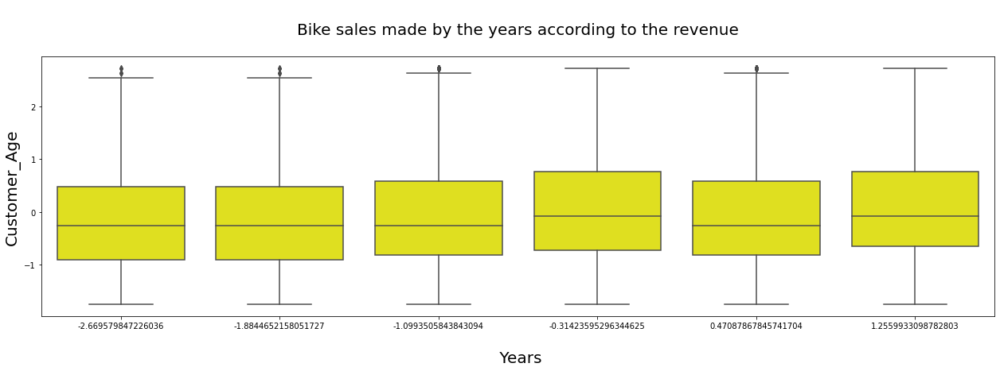

In [ ]:
sns.boxplot(x='Year',y='Customer_Age',data=dataset, color='yellow')
plt.title('\nBike sales made by the years according to the revenue\n', fontsize=20)
plt.xlabel("\n Years",fontsize=20)
plt.ylabel("Customer_Age",fontsize=20)
#plt.rcParams["figure.figsize"] = [17.55, 6.60]
#plt.rcParams["figure.autolayout"] = True

plt.show()

In [ ]:
categorical_dataset =  dataset.iloc[:,[0,1,2,3,4,5,6,7,8]]
categorical_dataset

,Date,Month,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product
0,2013-11-26,November,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike
1,2015-11-26,November,Youth (<25),M,Canada,British Columbia,Accessories,Bike Racks,Hitch Rack - 4-Bike
2,2014-03-23,March,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike
3,2016-03-23,March,Adults (35-64),M,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike
4,2014-05-15,May,Adults (35-64),F,Australia,New South Wales,Accessories,Bike Racks,Hitch Rack - 4-Bike
...,...,...,...,...,...,...,...,...,...
111505,2016-04-12,April,Adults (35-64),M,United Kingdom,England,Clothing,Vests,"Classic Vest, S"
111506,2014-04-02,April,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M"
111507,2016-04-02,April,Youth (<25),M,Australia,Queensland,Clothing,Vests,"Classic Vest, M"
111508,2014-03-04,March,Adults (35-64),F,France,Seine (Paris),Clothing,Vests,"Classic Vest, L"


In [ ]:
numerical_dataset =  dataset.iloc[:,[9,10,11, 12,13,14,15,16,17]]
numerical_dataset

,Day,Year,Customer_Age,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
0,1.17598,-1.09935,-1.5579,-0.407305,-0.406011,-0.362896,0.666864,-0.126384,0.145666
1,1.17598,0.470879,-1.5579,-0.407305,-0.406011,-0.362896,0.666864,-0.126384,0.145666
2,0.834413,-0.314236,1.23256,1.16084,-0.406011,-0.362896,2.37182,0.633829,1.25053
3,0.834413,1.25599,1.23256,0.84721,-0.406011,-0.362896,1.98073,0.481786,1.0122
4,-0.0764338,-0.314236,1.04652,-0.825477,-0.406011,-0.362896,-0.106518,-0.329108,-0.259425
...,...,...,...,...,...,...,...,...,...
111505,-0.418001,1.25599,0.488433,-0.93002,-0.444126,-0.423501,-0.383354,-0.450742,-0.437604
111506,-1.55656,-0.314236,-1.65092,1.0563,-0.444126,-0.423501,0.809676,0.0628244,0.323084
111507,-1.55656,1.25599,-1.65092,1.0563,-0.444126,-0.423501,0.809676,0.0628244,0.323084
111508,-1.32885,-0.314236,0.116371,1.26538,-0.444126,-0.423501,0.873392,0.116884,0.381715


b) Calculate the statistical parameters (mean, median, minimum, maximum, and standard deviation) for each of the numerical variables.

Mean:

In [ ]:
mean_Day = np.mean(dataset['Day'])
mean_Year = np.mean(dataset['Year'])
mean_Customer_Age = np.mean(dataset['Customer_Age'])
mean_Order_Quantity = np.mean(dataset['Order_Quantity'])
mean_Unit_Cost = np.mean(dataset['Unit_Cost'])
mean_Unit_Price = np.mean(dataset['Unit_Price'])
mean_Profit = np.mean(dataset['Profit'])
mean_Cost = np.mean(dataset['Cost'])
mean_Revenue = np.mean(dataset['Revenue'])


print ("The mean of the Column 'Day' is ", mean_Day)
print ("The mean of the Column 'Year' is ", mean_Year)
print ("The mean of the Column 'Customer_Age' is ", mean_Customer_Age)
print ("The mean of the Column 'Order Quantity' is ", mean_Order_Quantity)
print ("The mean of the Column 'Unit Cost' is ", mean_Unit_Cost)
print ("The mean of the Column 'Unit Price' is ", mean_Unit_Price)
print ("The mean of the Column 'Profit' is ", mean_Profit)
print ("The mean of the Column 'Cost' is ", mean_Cost)
print ("The mean of the  Column 'Revenue' is ", mean_Revenue)


The mean of the Column 'Day' is  2.9461780617243234e-16
The mean of the Column 'Year' is  -1.2818417597511208e-13
The mean of the Column 'Customer_Age' is  8.233805630055089e-17
The mean of the Column 'Order Quantity' is  -8.093387457444552e-15
The mean of the Column 'Unit Cost' is  -1.2871823795358318e-14
The mean of the Column 'Unit Price' is  6.539969992435956e-14
The mean of the Column 'Profit' is  8.9496510721457e-15
The mean of the Column 'Cost' is  -1.0822571975995866e-14
The mean of the  Column 'Revenue' is  1.495037615363876e-16


Median:

In [ ]:
median_Day = np.median(dataset['Day'])
median_Year = np.median(dataset['Year'])
median_Customer_Age = np.median(dataset['Customer_Age'])
median_Order_Quantity = np.median(dataset['Order_Quantity'])
median_Unit_Cost = np.median(dataset['Unit_Cost'])
median_Unit_Price = np.median(dataset['Unit_Price'])
median_Profit = np.median(dataset['Profit'])
median_Cost = np.median(dataset['Cost'])
median_Revenue = np.median(dataset['Revenue'])

print ("The Median of the Column 'Day' is ", median_Day)
print ("The Median of the Column 'Year' is ", median_Year)
print ("The Median of the Column 'Customer_Age' is ", median_Customer_Age)
print ("The Median of the Column 'Order Quantity' is ", median_Order_Quantity)
print ("The Median of the Column 'Unit Cost' is ", median_Unit_Cost)
print ("The Median of the Column 'Unit Price' is ", median_Unit_Price)
print ("The Median of the Column 'Profit' is ", median_Profit)
print ("The Median of the Column 'Cost' is ", median_Cost)
print ("The Median of the Column 'Revenue' is ", median_Revenue)

The Median of the Column 'Day' is  0.03742201924842233
The Median of the Column 'Year' is  -0.31423595296344625
The Median of the Column 'Customer_Age' is  -0.16267461538609243
The Median of the Column 'Order Quantity' is  -0.19821909489578318
The Median of the Column 'Unit Cost' is  -0.4713508231555374
The Median of the Column 'Unit Price' is  -0.4657075218956822
The Median of the Column 'Profit' is  -0.4031275337303545
The Median of the Column 'Cost' is  -0.40569212814449135
The Median of the Column 'Revenue' is  -0.404861432667675


Minimum:

In [ ]:
min_Day = np.min(dataset['Day'])
min_Year = np.min(dataset['Year'])
min_Customer_Age = np.min(dataset['Customer_Age'])
min_Order_Quantity = np.min(dataset['Order_Quantity'])
min_Unit_Cost = np.min(dataset['Unit_Cost'])
min_Unit_Price = np.min(dataset['Unit_Price'])
min_Profit = np.min(dataset['Profit'])
min_Cost = np.min(dataset['Cost'])
min_Revenue = np.min(dataset['Revenue'])

print ("The Minimum of the Column 'Day' is ", min_Day)
print ("The Minimum of the Column 'Year' is ", min_Year)
print ("The Minimum of the Column 'Customer Age' is ", min_Customer_Age)
print ("The Minimum of the Column 'Order Quantity' is ", min_Order_Quantity)
print ("The Minimum of the Column 'Unit Cost' is ", min_Unit_Cost)
print ("The Minimum of the Column 'Unit Price' is ", min_Unit_Price)
print ("The Minimum of the Column 'Profit' is ", min_Profit)
print ("The Minimum of the Column 'Cost' is ", min_Cost)
print ("The Minimum of the Column 'Revenue' is ", min_Revenue)

The Minimum of the Column 'Day' is  -1.670415161070627
The Minimum of the Column 'Year' is  -2.669579847226036
The Minimum of the Column 'Customer Age' is  -1.7439349381681337
The Minimum of the Column 'Order Quantity' is  -1.1391056404806326
The Minimum of the Column 'Unit Cost' is  -0.48587076181638506
The Minimum of the Column 'Unit Price' is  -0.49059865785531726
The Minimum of the Column 'Profit' is  -0.6953428023186703
The Minimum of the Column 'Cost' is  -0.5307049510108697
The Minimum of the Column 'Revenue' is  -0.5761874532260747


Maximum

In [ ]:
max_Day = np.max(dataset['Day'])
max_Year = np.max(dataset['Year'])
max_Customer_Age = np.max(dataset['Customer_Age'])
max_Order_Quantity = np.max(dataset['Order_Quantity'])
max_Unit_Cost = np.max(dataset['Unit_Cost'])
max_Unit_Price = np.max(dataset['Unit_Price'])
max_Profit = np.max(dataset['Profit'])
max_Cost = np.max(dataset['Cost'])
max_Revenue = np.max(dataset['Revenue'])

print ("The Maximum of the Column 'Day' is ", max_Day)
print ("The Maximum of the Column 'Year' is ", max_Year)
print ("The Maximum of the Column 'Customer Age' is ", max_Customer_Age)
print ("The Maximum of the Column 'Order Quantity' is ", max_Order_Quantity)
print ("The Maximum of the Column 'Unit Cost' is ", max_Unit_Cost)
print ("The Maximum of the Column 'Unit Price' is ", max_Unit_Price)
print ("The Maximum of the Column 'Profit' is ", max_Profit)
print ("The Maximum of the Column 'Cost' is ", max_Cost)
print ("The Maximum of the Column 'Revenue' is ", max_Revenue)

The Maximum of the Column 'Day' is  1.7452591995674716
The Maximum of the Column 'Year' is  1.2559933098782803
The Maximum of the Column 'Customer Age' is  2.7208000908635124
The Maximum of the Column 'Order Quantity' is  2.1017257943116263
The Maximum of the Column 'Unit Cost' is  3.452662599938546
The Maximum of the Column 'Unit Price' is  3.3794318722166308
The Maximum of the Column 'Profit' is  32.53810195457505
The Maximum of the Column 'Cost' is  47.87178233122646
The Maximum of the Column 'Revenue' is  43.64267772840674


Standard Deviation:

In [ ]:
std_Day = np.std(dataset['Day'])
std_Year = np.std(dataset['Year'])
std_Customer_Age = np.std(dataset['Customer_Age'])
std_Order_Quantity = np.std(dataset['Order_Quantity'])
std_Unit_Cost = np.std(dataset['Unit_Cost'])
std_Unit_Price = np.std(dataset['Unit_Price'])
std_Profit = np.std(dataset['Profit'])
std_Cost = np.std(dataset['Cost'])
std_Revenue = np.std(dataset['Revenue'])

print ("The Standard Deviation of the Column 'Day' is ", std_Day)
print ("The Standard Deviation of the Column 'Year' is ", std_Year)
print ("The Standard Deviation of the Column 'Customer_Age' is ", std_Customer_Age)
print ("The Standard Deviation of the Column 'Order_Quantity' is ", std_Order_Quantity)
print ("The Standard Deviation of the Column 'Unit_Cost' is ", std_Unit_Cost)
print ("The Standard Deviation of the Column 'Unit_Price' is ", std_Unit_Price)
print ("The Standard Deviation of the Column 'Profit' is ", std_Profit)
print ("The Standard Deviation of the Column 'Cost' is ", std_Cost)
print ("The Standard Deviation of the Column 'Revenue' is ", std_Revenue)

The Standard Deviation of the Column 'Day' is  1.0
The Standard Deviation of the Column 'Year' is  0.9999999999999999
The Standard Deviation of the Column 'Customer_Age' is  0.9999999999999999
The Standard Deviation of the Column 'Order_Quantity' is  1.0
The Standard Deviation of the Column 'Unit_Cost' is  1.0
The Standard Deviation of the Column 'Unit_Price' is  0.9999999999999999
The Standard Deviation of the Column 'Profit' is  0.9999999999999999
The Standard Deviation of the Column 'Cost' is  0.9999999999999999
The Standard Deviation of the Column 'Revenue' is  1.0


d) Line, Scatter and Heatmaps can be used to show the correlation between the features of the dataset.

Scatter

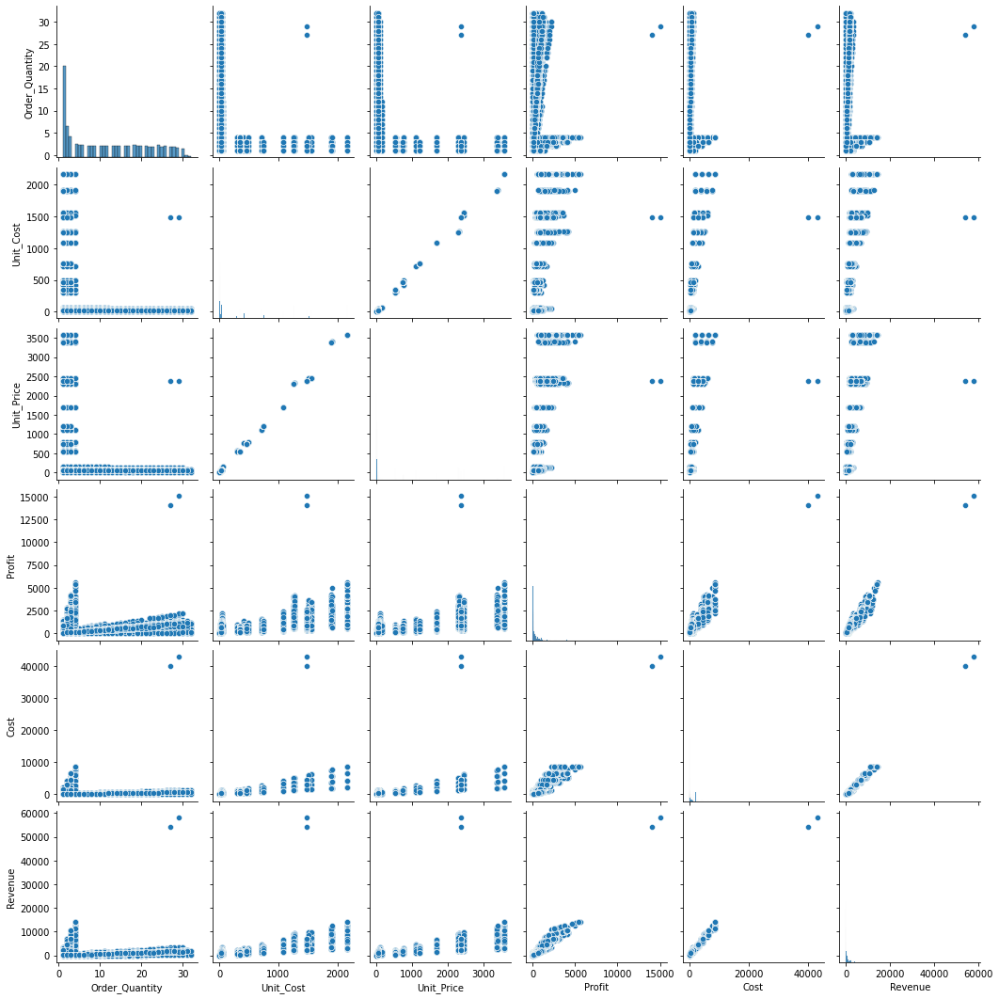

In [ ]:
num_sales = dataset_wo_duplicates.iloc[:,[12, 13, 14, 15, 16, 17]]
sns.pairplot(num_sales)

Heatmap

In [ ]:
categorical_sales = dataset_wo_duplicates.iloc[:,[4, 12, 13, 14, 15, 16, 17]]
plt.figure(figsize=(12,12))
sns.set_context('paper', font_scale=1.4)
categorical_sales = categorical_sales.corr()
categorical_sales

,Customer_Age,Order_Quantity,Unit_Cost,Unit_Price,Profit,Cost,Revenue
Customer_Age,1.000000,0.025039,-0.016421,-0.015294,0.007935,-0.012049,-0.005396
Order_Quantity,0.025039,1.000000,-0.516909,-0.517002,-0.239575,-0.340998,-0.313577
Unit_Cost,-0.016421,-0.516909,1.000000,0.997890,0.740817,0.829503,0.817569
Unit_Price,-0.015294,-0.517002,0.997890,1.000000,0.749628,0.825902,0.818188
Profit,0.007935,-0.239575,0.740817,0.749628,1.000000,0.902170,0.956523
Cost,-0.012049,-0.340998,0.829503,0.825902,0.902170,1.000000,0.988761
Revenue,-0.005396,-0.313577,0.817569,0.818188,0.956523,0.988761,1.000000


<Figure size 864x864 with 0 Axes>

Text(0.5, 1.0, '\nCORRELATION BETWEEN NUMERICAL DATA\n\n\n')

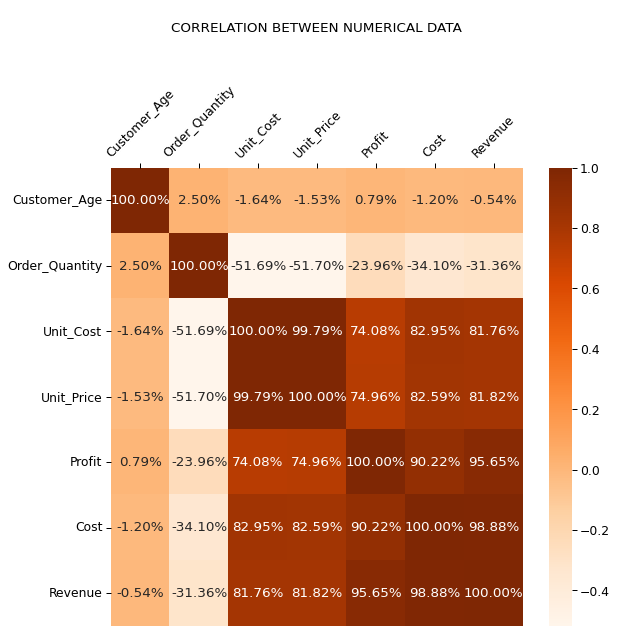

In [ ]:
#Categorical data
fig_sales, ax_sales = plt.subplots(figsize=(9, 9))
sns.heatmap(categorical_sales, annot=True, cmap='Oranges', fmt = ".2%")
# Labels at Y
ax_sales.xaxis.tick_top()
xticks_labels_sales = ['Customer_Age', 'Order_Quantity', 'Unit_Cost', 'Unit_Price', 'Profit', 'Cost', 'Revenue']
plt.xticks(rotation=45)
plt.xticks(np.arange(7) + .5, labels=xticks_labels_sales)
# Label at Axes
yticks_labels_sales = ['Customer_Age', 'Order_Quantity', 'Unit_Cost', 'Unit_Price', 'Profit', 'Cost', 'Revenue']
plt.yticks(np.arange(7) + .5, labels=yticks_labels_sales)
# Title
plt.title('\nCORRELATION BETWEEN NUMERICAL DATA\n\n\n'.upper(), loc='center')

f) Apply dummy encoding to categorical variables (at least one variable use from the data set) and discuss the benefits of dummy encoding to understand the categorical data.

Dummies

In [ ]:
cat_ds = dataset.iloc[:,[1,2,3,4,5,6,7,8]]
prefix = ['Month',	'Age_Group',	'Customer_Gender',	'Country',	'State',	'Product_Category',	'Sub_Category',	'Product']
pd.get_dummies(cat_ds, prefix = prefix, )

,Month_April,Month_August,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September,Age_Group_Adults (35-64),Age_Group_Seniors (64+),Age_Group_Young Adults (25-34),Age_Group_Youth (<25),Customer_Gender_F,Customer_Gender_M,Country_Australia,Country_Canada,Country_France,Country_Germany,Country_United Kingdom,Country_United States,State_Alabama,State_Alberta,State_Arizona,State_Bayern,State_Brandenburg,State_British Columbia,State_California,State_Charente-Maritime,State_England,State_Essonne,State_Florida,State_Garonne (Haute),State_Georgia,State_Hamburg,State_Hauts de Seine,State_Hessen,...,"Product_Road-650 Red, 62","Product_Road-750 Black, 44","Product_Road-750 Black, 48","Product_Road-750 Black, 52","Product_Road-750 Black, 58","Product_Short-Sleeve Classic Jersey, L","Product_Short-Sleeve Classic Jersey, M","Product_Short-Sleeve Classic Jersey, S","Product_Short-Sleeve Classic Jersey, XL","Product_Sport-100 Helmet, Black","Product_Sport-100 Helmet, Blue","Product_Sport-100 Helmet, Red",Product_Touring Tire,Product_Touring Tire Tube,"Product_Touring-1000 Blue, 46","Product_Touring-1000 Blue, 50","Product_Touring-1000 Blue, 54","Product_Touring-1000 Blue, 60","Product_Touring-1000 Yellow, 46","Product_Touring-1000 Yellow, 50","Product_Touring-1000 Yellow, 54","Product_Touring-1000 Yellow, 60","Product_Touring-2000 Blue, 46","Product_Touring-2000 Blue, 50","Product_Touring-2000 Blue, 54","Product_Touring-2000 Blue, 60","Product_Touring-3000 Blue, 44","Product_Touring-3000 Blue, 50","Product_Touring-3000 Blue, 54","Product_Touring-3000 Blue, 58","Product_Touring-3000 Blue, 62","Product_Touring-3000 Yellow, 44","Product_Touring-3000 Yellow, 50","Product_Touring-3000 Yellow, 54","Product_Touring-3000 Yellow, 58","Product_Touring-3000 Yellow, 62",Product_Water Bottle - 30 oz.,"Product_Women's Mountain Shorts, L","Product_Women's Mountain Shorts, M","Product_Women's Mountain Shorts, S"
0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111505,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
111506,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
111507,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
111508,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Encoding categorical data: Label Encoding

In [ ]:
label_encoder = preprocessing.LabelEncoder()

encoded_dataset = categorical_dataset
encoded_dataset['Date'] = label_encoder.fit_transform(categorical_dataset['Age_Group'])
encoded_dataset['Month']= label_encoder.fit_transform(categorical_dataset['Country']) 
encoded_dataset['Age_Group'] = label_encoder.fit_transform(categorical_dataset['Age_Group'])
encoded_dataset['Customer_Gender']= label_encoder.fit_transform(categorical_dataset['State'])
encoded_dataset['Country']= label_encoder.fit_transform(categorical_dataset['Country'])
encoded_dataset['State']= label_encoder.fit_transform(categorical_dataset['State']) 
encoded_dataset['Product_Category'] = label_encoder.fit_transform(categorical_dataset['Age_Group'])
encoded_dataset['Sub_Category']= label_encoder.fit_transform(categorical_dataset['Country'])
encoded_dataset['Product']= label_encoder.fit_transform(categorical_dataset['State']) 
encoded_dataset

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

,Date,Month,Age_Group,Customer_Gender,Country,State,Product_Category,Sub_Category,Product
0,3,1,3,5,1,5,3,1,5
1,3,1,3,5,1,5,3,1,5
2,0,0,0,26,0,26,0,0,26
3,0,0,0,26,0,26,0,0,26
4,0,0,0,26,0,26,0,0,26
...,...,...,...,...,...,...,...,...,...
111505,0,4,0,8,4,8,0,4,8
111506,3,0,3,35,0,35,3,0,35
111507,3,0,3,35,0,35,3,0,35
111508,0,2,0,37,2,37,0,2,37


g) Apply PCA with your chosen number of components. Write up a short profile of the first few components extracted based on your understanding.

Two Components

In [ ]:
pca_bikes_2comp = PCA(n_components=2)
pca_bikes2 = pca_bikes_2comp.fit_transform(numerical_dataset)
pca_bikes_2components = pd.DataFrame(data = pca_bikes2, columns = ['Component_1', 'Component_2'])

categorical_Country =  dataset.loc[:,['Country']]
categorical_Product_Category =  dataset.loc[:,['Product_Category']]
categorical_Age_Group =  dataset.loc[:,['Age_Group']]

pca_bikes_2components.insert(0, "Age_Group",categorical_Age_Group, True)
pca_bikes_2components.insert(0, "Product_Category",categorical_Product_Category, True)
pca_bikes_2components.insert(0, "Country",categorical_Country, True)

pca_bikes_2components

,Country,Product_Category,Age_Group,Component_1,Component_2
0,Canada,Accessories,Youth (<25),0.201258,-2.096984
1,Canada,Accessories,Youth (<25),0.000084,-1.493801
2,Australia,Accessories,Adults (35-64),1.244412,1.242802
3,Australia,Accessories,Adults (35-64),0.781589,1.696900
4,Australia,Accessories,Adults (35-64),-0.414506,0.512016
...,...,...,...,...,...
111505,United Kingdom,Clothing,Adults (35-64),-0.877320,0.730651
111506,Australia,Clothing,Youth (<25),-0.063062,-0.424595
111507,Australia,Clothing,Youth (<25),-0.264236,0.178587
111508,France,Clothing,Adults (35-64),-0.048175,0.938974


In [ ]:
print('Explained variation per principal component: {}'.format(pca_bikes_2comp.explained_variance_ratio_))

Explained variation per principal component: [0.52426236 0.11486317]


It is observed that the component_1 holds 52.426236% of the information while the Component_2 holds 11.486317% of the information. On the other hand, from six-dimensional data to a two-dimensional data, 36.087447% information was lost.

In [ ]:
fig_2componentes = px.scatter(pca_bikes_2components, x='Component_1', y='Component_2', hover_data=['Country', 'Age_Group'], color='Product_Category')
fig_2componentes.update_layout(title_text="Principal Component Analysis (PCA) with 2 components")
fig_2componentes.show()

Three components

In [ ]:
pca_bikes_3comp = PCA(n_components=3)
pca_bikes3 = pca_bikes_3comp.fit_transform(numerical_dataset)
pca_bikes_3components = pd.DataFrame(data = pca_bikes3, columns = ['Component_1', 'Component_2', 'Component_3'])

pca_bikes_3components.insert(0, "Age_Group",categorical_Age_Group, True)
pca_bikes_3components.insert(0, "Product_Category",categorical_Product_Category, True)
pca_bikes_3components.insert(0, "Country",categorical_Country, True)


pca_bikes_3components

,Country,Product_Category,Age_Group,Component_1,Component_2,Component_3
0,Canada,Accessories,Youth (<25),0.201258,-2.096984,0.407606
1,Canada,Accessories,Youth (<25),0.000084,-1.493801,0.676620
2,Australia,Accessories,Adults (35-64),1.244412,1.242802,1.545921
3,Australia,Accessories,Adults (35-64),0.781589,1.696900,1.723101
4,Australia,Accessories,Adults (35-64),-0.414506,0.512016,0.070441
...,...,...,...,...,...,...
111505,United Kingdom,Clothing,Adults (35-64),-0.877320,0.730651,-0.197369
111506,Australia,Clothing,Youth (<25),-0.063062,-0.424595,-1.756197
111507,Australia,Clothing,Youth (<25),-0.264236,0.178587,-1.487183
111508,France,Clothing,Adults (35-64),-0.048175,0.938974,-0.950120


In [ ]:
print('Explained variation per principal component: {}'.format(pca_bikes_3comp.explained_variance_ratio_))

Explained variation per principal component: [0.52426236 0.11486317 0.11044366]


It is observed that the component_1 holds 52.426236% of the information, Component_2 holds 11.486317% of the information and Component_3 holds 11.044366%. On the other hand, from six-dimensional data to a two-dimensional data, 25.04308% information was lost.

In [ ]:
fig_3componentes = px.scatter_3d(pca_bikes_3components, x='Component_1', y='Component_2', z ='Component_3', hover_data=['Country', 'Age_Group'], color='Product_Category')
fig_3componentes.update_layout(title_text="Principal Component Analysis (PCA) with 3 components")
fig_3componentes.show()